## HOW TO USE THIS CODE


Orignal data set is downloaded here 
https://www.kaggle.com/datasets/emirhanai/human-action-detection-artificial-intelligence

But this data is modified and all unnecessary files have been removed. The modified data is provided along with the thesis. 

Only 5 classes are selected 
from the orignal Dataset. The dataset which can be used to train and test the models are attached 

Google drive is mounted so we don't have to upload the again if our Runtime get closed 
This video is helpful to connect google drive
https://www.youtube.com/watch?v=PA1WPr0o_DY

Attached file should be uploaded to the google drive. 

Next we need to find a file path of the folder to be used 
replace the path variable when loading the files


## Workflow

The workflow is from top to botton. 

First all we shoud execute all the sub sections of code int the helper functions. These helper functions will be used in the later part of the project 



## Helper Functions


In [17]:

# This function is used to read the image from the path which is passed to the 
def plotImageFromFilePath(image_path):
  """
  used to read the image from the given path and show on the screen
  """
  plt.imshow(plt.imread(image_path))

In [18]:
import random


def show_images(images, number=5):
  """
  Used to plot given number of images
  gets the path of the images in a list and 
  number which is for the number of images to show 
  """
  # setup the figure size
  plt.figure(figsize=(30, 30))

  for i in range(number):
    ax = plt.subplot(10, 10, i+1)
    pic_num = random.randrange(len(images))
    plotImageFromFilePath(images[pic_num])
    
    plt.axis("off")

In [19]:
# Create a function to read the image from the given path, 
# Turn it into tensor, scale it down to from 0 - 255, 
# and resize it to 

IMAGE_SIZE = 224
# Read the image from the path which is passed and turn it into a tensor
def process_image(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])

  return image



In [20]:
# used to get initial labels for all the given classes 
def getInitialLabels(totalClasses):
  labelsToReturn = []
  for i in range(totalClasses):
    label = np.zeros(totalClasses)
    label[i] = 1
    labelsToReturn.append(label)
  return labelsToReturn

In [21]:
# Create labels for all the given classes 
def getLabels(numOfLabels):
  initialLabels = getInitialLabels(len(numOfLabels))
  a1 = np.zeros([1, len(numOfLabels)])
  for i in range(len(numOfLabels)):
    for j in range(numOfLabels[i]):
      a1 = np.append(a1, [initialLabels[i]], axis=0)
  a1 = np.delete(a1, 0, 0)
  return a1

In [22]:
# Define Batch Size 
BATCH_SIZE = 32

# default batch size of 32, 
# Also used to create data batches for testing data 
# to create testing data batch simply pass valid_data = True 
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image(X) and label y pairs,
  """
  if valid_data:
    print("Creating validation data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # shuffle training data
  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [23]:
# used to get image labels (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return (image, label)


In [24]:
# spliting data into train and validation 
def getTrainTestSplittedData(X, y, size_test):
  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state = 42)
  print(len(X_train), len(y_train), len(X_val), len(y_val))
  return [X_train, y_train, X_val, y_val]


In [25]:
# Validation accuracey and training accuracy
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


In [26]:
# Validation Loss and training Loss

def plot_hist_loss(hist):
    plt.plot(hist.history["loss"])
    plt.plot(hist.history["val_loss"])
    plt.title("model accuracy")
    plt.ylabel("loss")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


In [27]:
######################## CONFUSION MATRIX ##############################

from sklearn.metrics import confusion_matrix
import itertools
# Code Reference  
# https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/06_transfer_learning_in_tensorflow_part_3_scaling_up.ipynb

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] 
  n_classes = cm.shape[0] # number of classes

  # Plot 
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # For list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create axis for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels,
         yticklabels=labels)
  
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  threshold = (cm.max() + cm.min()) / 2.

  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

## Data Ingestion, Preprocessing and Data Segregation

In [29]:
from google.colab import drive
drive.mount('/content/drive')

In [30]:
# Imports 
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

In [42]:
import datetime

In [31]:
IMAGE_SHAPE = (224, 224)

In [32]:
## Define number of images we want to import
# Predicted class will be in this order for example [1, 0, 0, 0, 0] means its drinking image
NUMBER_OF_DRINKING_IMG = 500
NUMBER_OF_CYCLYING_IMG = 500
NUMBER_OF_SLEEPING_IMG = 500
NUMBER_OF_SITTING_IMG = 500
NUMBER_OF_USINGLAPTOP_IMG = 500

In [33]:
# Define path for images to be imported 
# Get different images path to different list 

# replace the path accordingly 
path = "/content/drive/MyDrive/Action/ActionsToWork"

CYCLYING_IMAGES_PATH = [path + "/cycling/cycling (" + str(number+1) + ")" + ".jpg" 
                        for number in range(NUMBER_OF_CYCLYING_IMG)]

DRINKING_IMAGES_PATH = [path + "/drinking/drinking (" + str(number+1) + ")" + ".jpg" 
                        for number in range(NUMBER_OF_DRINKING_IMG)]

SITTING_IMAGES_PATH = [path + "/sitting/sitting (" + str(number+1) + ")" + ".jpg" 
                       for number in range(NUMBER_OF_SITTING_IMG)]

USINGLAPTOP_IMAGES_PATH = [path + "/using_laptop/usingLaptop (" + str(number+1) + ")" + ".jpg" 
                           for number in range(NUMBER_OF_USINGLAPTOP_IMG)]

SLEEPING_IMAGES_PATH = [path + "/sleeping/sleeping (" + str(number+1) + ")" + ".jpg" 
                        for number in range(NUMBER_OF_SLEEPING_IMG)]





In [34]:
# Combine all the paths of images 
allFilesPaths = DRINKING_IMAGES_PATH + CYCLYING_IMAGES_PATH + SLEEPING_IMAGES_PATH + SITTING_IMAGES_PATH + USINGLAPTOP_IMAGES_PATH


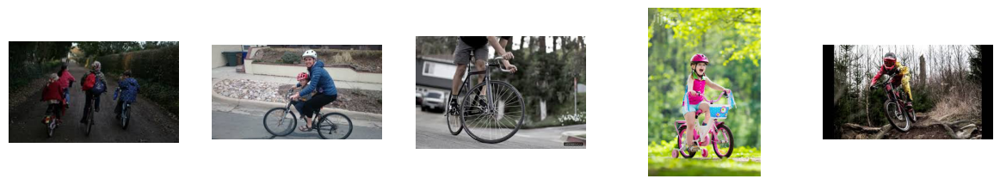

In [35]:
# Change the path and number of images to test different class
# Visualize Random Images 
show_images(CYCLYING_IMAGES_PATH, 5)



In [36]:
# use helper function to create labels for all the images
# labels are one-hot encoded 
allLabels = getLabels([NUMBER_OF_DRINKING_IMG, NUMBER_OF_CYCLYING_IMG, NUMBER_OF_SLEEPING_IMG, NUMBER_OF_SITTING_IMG, NUMBER_OF_USINGLAPTOP_IMG])


In [37]:
# Split the data 
X_train, y_train, X_val, y_val = getTrainTestSplittedData(allFilesPaths, allLabels, 0.33)
X_train, y_train, X_test, y_test = getTrainTestSplittedData(X_train, y_train, 0.50)

# Create batches
training_data = create_data_batches(X_train, y_train, batch_size=32)
validation_data = create_data_batches(X_val, y_val, batch_size=32, valid_data=True)
testing_data = create_data_batches(X_test, y_test, batch_size=32, valid_data=True)

2000 2000 500 500
1600 1600 400 400
Creating training data batches
Creating validation data batches.....
Creating validation data batches.....


## Feature Extractor Model Creation, Compilation, Training


### Using URL to create Feature Extractor

In [ ]:
# Example of How to create Feature Extractor using a model_URL, 
# This example is not used 

vgg19 = "https://tfhub.dev/emilutz/vgg19-block1-conv2-unpooling-encoder/1"

def create_model(model_url, num_classes=5):
  """Takes a TensorFlow Hub URL and creates a Keras Sequential model with it.
  
  Args:
    model_url (str): A TensorFlow Hub feature extraction URL.
    num_classes (int): Number of output neurons in output layer,
      
  Returns:
    An uncompiled model with model_url as feature
    extractor layer and Dense output layer with num_classes outputs.
  """
  # Download the pretrained model 
  feature_extractor_layer = hub.KerasLayer(model_url,
                                           trainable=False,
                                           name='feature_extraction_layer',
                                           input_shape=IMAGE_SHAPE+(3,))
  
  # Create model
  model = tf.keras.Sequential([
    feature_extractor_layer, # feature extraction layer
    layers.Dense(num_classes, activation='softmax', name='output_layer') # output layer      
  ])

  return model

### Model 1 for Ensemble 

In [38]:
# Load the pretrained model from keras Api and set the trainable to false
# Because we don't want to update the weights of the feature extraction layer
base_model = tf.keras.applications.InceptionV3(include_top=False)
base_model.trainable = False


87910968/87910968 [==============================] - 5s 0us/step


In [39]:
len(base_model.layers)

311

In [ ]:
# Enumerate through layers in the base model and check if all the
# layers.trainable is set to False
for layer in enumerate(base_model.layers):
  print(layer.name, layer.trainable)


In [ ]:
# To check the number of trainable variables, In This case we set the base
# model trainable to be false in the last step 
len(base_model.trainable_variables)

In [ ]:
base_model.layers[-1].output

In [40]:
# Create our first model for ensemble
# we can add additional layer for hyperparameter After global Average pooling layer  

model = tf.keras.Sequential()

model.add(tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer"))
model.add(base_model)
model.add(tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer"))
model.add(layers.Dense(5, activation='softmax', name='output_layer'))



In [43]:

# compile model, define loss function, optimizer and metrics 
model.compile(loss='categorical_crossentropy',
                           optimizer=tf.keras.optimizers.Adam(),
                           metrics=['accuracy'])


log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


In [44]:
# fit the model and start training process, validation data is for validation 
# to check if model is overfitting or not 
# We can change epochs to get better performance 
model.fit(training_data,epochs=3, validation_data=validation_data, callbacks=[tensorboard_callback])

Epoch 1/3
50/50 [==============================] - 936s 19s/step - loss: 0.8475 - accuracy: 0.6994 - val_loss: 0.6123 - val_accuracy: 0.7720
Epoch 2/3
50/50 [==============================] - 11s 223ms/step - loss: 0.4761 - accuracy: 0.8325 - val_loss: 0.5038 - val_accuracy: 0.8140
Epoch 3/3
50/50 [==============================] - 10s 208ms/step - loss: 0.3664 - accuracy: 0.8744 - val_loss: 0.4915 - val_accuracy: 0.8240


In [48]:
%load_ext tensorboard 

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [51]:
%tensorboard --logdir 'logs/fit'


Reusing TensorBoard on port 6006 (pid 13447), started 0:18:26 ago. (Use '!kill 13447' to kill it.)

<IPython.core.display.Javascript object>

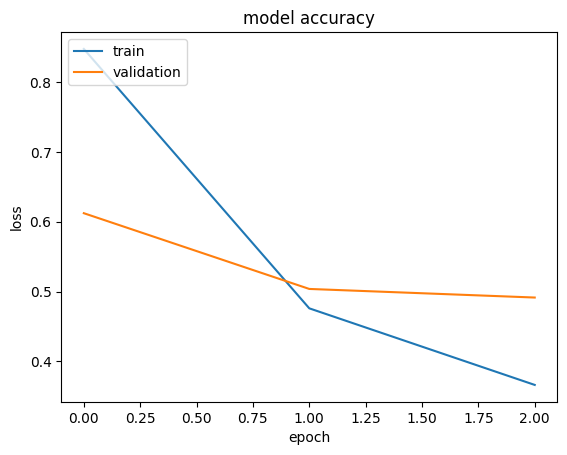

In [52]:
# plot loss of the model 
plot_hist_loss(model.history)


In [ ]:
# plot accuracy of the model 
plot_hist(model.history)

### Model 2 for Ensemble

In [ ]:
# Load the pretrained model from keras Api and set the trainable to false
# Because we don't want to update the weights of the feature extraction layer
base_model_2 = tf.keras.applications.ResNet50V2(include_top=False, input_shape=IMAGE_SHAPE+(3,))
base_model_2.trainable = False

94668760/94668760 [==============================] - 5s 0us/step


In [ ]:
model_2 = tf.keras.Sequential()

model_2.add(tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer"))
model_2.add(base_model_2)
model_2.add(tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer"))
model_2.add(layers.Dense(5, activation='softmax', name='output_layer'))



In [ ]:
# compile model
model_2.compile(loss='categorical_crossentropy',
                           optimizer=tf.keras.optimizers.Adam(),
                           metrics=['accuracy'])
# fit the model
model_2.fit(training_data,epochs=3, validation_data=validation_data)

Epoch 1/3
50/50 [==============================] - 13s 147ms/step - loss: 0.8447 - accuracy: 0.6819 - val_loss: 0.5140 - val_accuracy: 0.8120
Epoch 2/3
50/50 [==============================] - 7s 141ms/step - loss: 0.4051 - accuracy: 0.8594 - val_loss: 0.4487 - val_accuracy: 0.8320
Epoch 3/3
50/50 [==============================] - 6s 113ms/step - loss: 0.3159 - accuracy: 0.8863 - val_loss: 0.4230 - val_accuracy: 0.8280


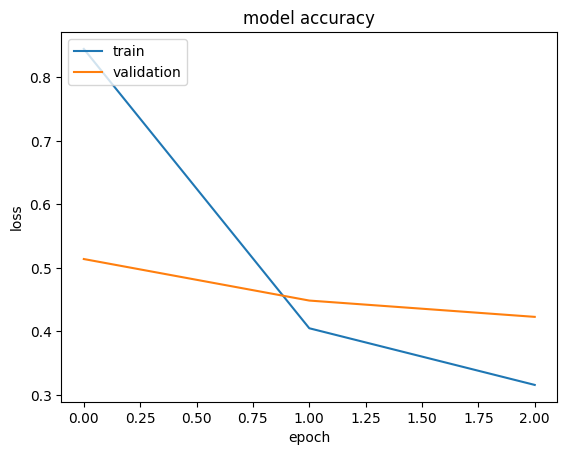

In [ ]:
plot_hist_loss(model_2.history)


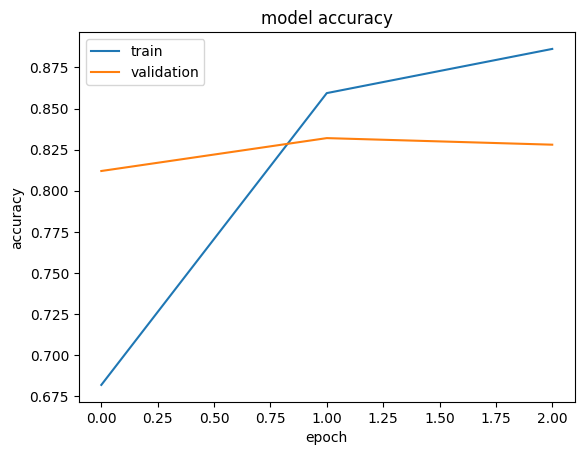

In [ ]:
plot_hist(model_2.history)

### Model 3 For Ensemble

In [ ]:
# Load the pretrained model from keras Api and set the trainable to false
# Because we don't want to update the weights of the feature extraction layer
base_model_3 = tf.keras.applications.VGG19(include_top=False)
base_model_3.trainable = False

80134624/80134624 [==============================] - 4s 0us/step


In [ ]:
# Create third model for ensemble 
model_3 = tf.keras.Sequential()
model_3.add(tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer"))
model_3.add(base_model_3)
model_3.add(tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer"))
model_3.add(layers.Dense(64, activation='relu'))
model_3.add(layers.Dense(5, activation='softmax', name='output_layer'))



In [ ]:
# compile model
model_3.compile(loss='categorical_crossentropy',
                           optimizer=tf.keras.optimizers.Adam(),
                           metrics=['accuracy'])
# fit the model
model_3.fit(training_data,epochs=3, validation_data=validation_data)

Epoch 1/3
50/50 [==============================] - 20s 283ms/step - loss: 1.4948 - accuracy: 0.3819 - val_loss: 1.3289 - val_accuracy: 0.5660
Epoch 2/3
50/50 [==============================] - 14s 275ms/step - loss: 1.2302 - accuracy: 0.5925 - val_loss: 1.0916 - val_accuracy: 0.6600
Epoch 3/3
50/50 [==============================] - 14s 271ms/step - loss: 1.0426 - accuracy: 0.6481 - val_loss: 0.9577 - val_accuracy: 0.6780


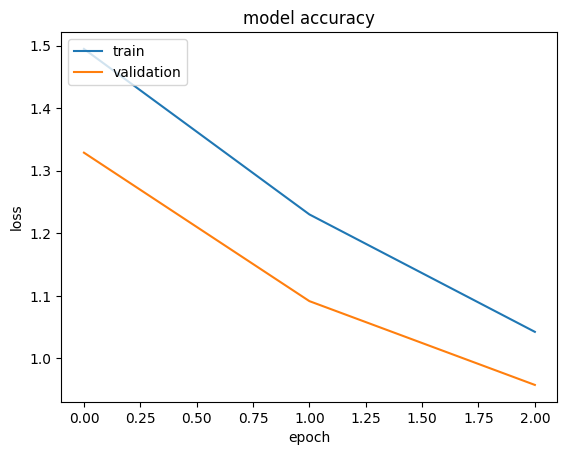

In [ ]:
plot_hist_loss(model_3.history)


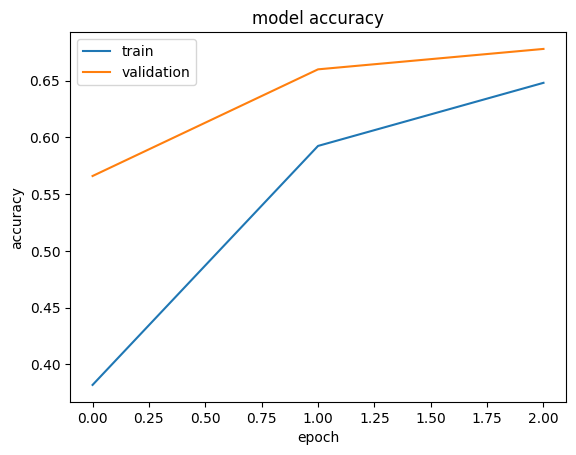

In [ ]:
plot_hist(model_3.history)

## Making Predictions

### model 1 evaluation

In [ ]:
# Evaluate on test data 
model_evalution_test_data = model.evaluate(testing_data)
model_evalution_test_data

# value at first index is for loss and for second it is accuracy

50/50 [==============================] - 4s 74ms/step - loss: 0.2375 - accuracy: 0.9275


[0.23754912614822388, 0.9275000095367432]

In [ ]:
# plot loss of the model 
plot_hist_loss(model.history)

In [ ]:
# plot accuracy of the model 
plot_hist(model.history)

### Model 2 Evaluation

In [ ]:
# Evaluate on test data 
model_evalution_test_data = model_2.evaluate(testing_data)
model_evalution_test_data

# value at first index is for loss and for second it is accuracy

In [ ]:
# plot loss of the model 
plot_hist_loss(model.history)


In [ ]:
# plot accuracy of the model 
plot_hist(model.history)

### Model 3 Evaluation

In [ ]:
# Evaluate on test data 
model_evalution_test_data = model_3.evaluate(testing_data)
model_evalution_test_data

# value at first index is for loss and for second it is accuracy

In [ ]:
# plot loss of the model 
plot_hist_loss(model.history)


In [ ]:
# plot accuracy of the model 
plot_hist(model.history)

## Making Predictions with the model

In [ ]:
from tensorflow.python.ops.gen_math_ops import arg_max

# select the class, should belong to one of 
class_to_predict = USINGLAPTOP_IMAGES_PATH

# right index of classified class 
# drinking image is at 0, cycling at 1, sleeping at 2, sitting at 3, using laptop at 4
class_label_right = 4

total_images_to_test = 500
wronge_count = 0

for i in range(total_images_to_test):
  Image_path = class_to_predict[i]
  image = process_image(Image_path)
  image = tf.expand_dims(image, axis=0)
  val = model.predict(image)
  val = np.argmax(val[0])
  if val != class_label_right:
    wronge_count = wronge_count + 1


print("wrong counts ", wronge_count)


In [ ]:
# Classes name for confusion matrix 
class_names = ["DRINKING_IMG", "CYCLYING_IMG", "SLEEPING_IMG", "SITTING_IMG", "USINGLAPTOP_IMG"]

In [ ]:
# list having all the labels 
y_labels = []
for images, labels in testing_data.unbatch(): 
  y_labels.append(labels.numpy().argmax())  

# to see how does the labels looks like 
y_labels[:5] 

[2, 2, 0, 4, 1, 3, 1, 3, 1, 4]

### First Model Confusion Matrix

In [ ]:
# make predictions using test_data using model
testing_data_predict_model_1 = model.predict(testing_data)
pred_classes_1 = testing_data_predict_model_1.argmax(axis=1)


13/13 [==============================] - 1s 80ms/step


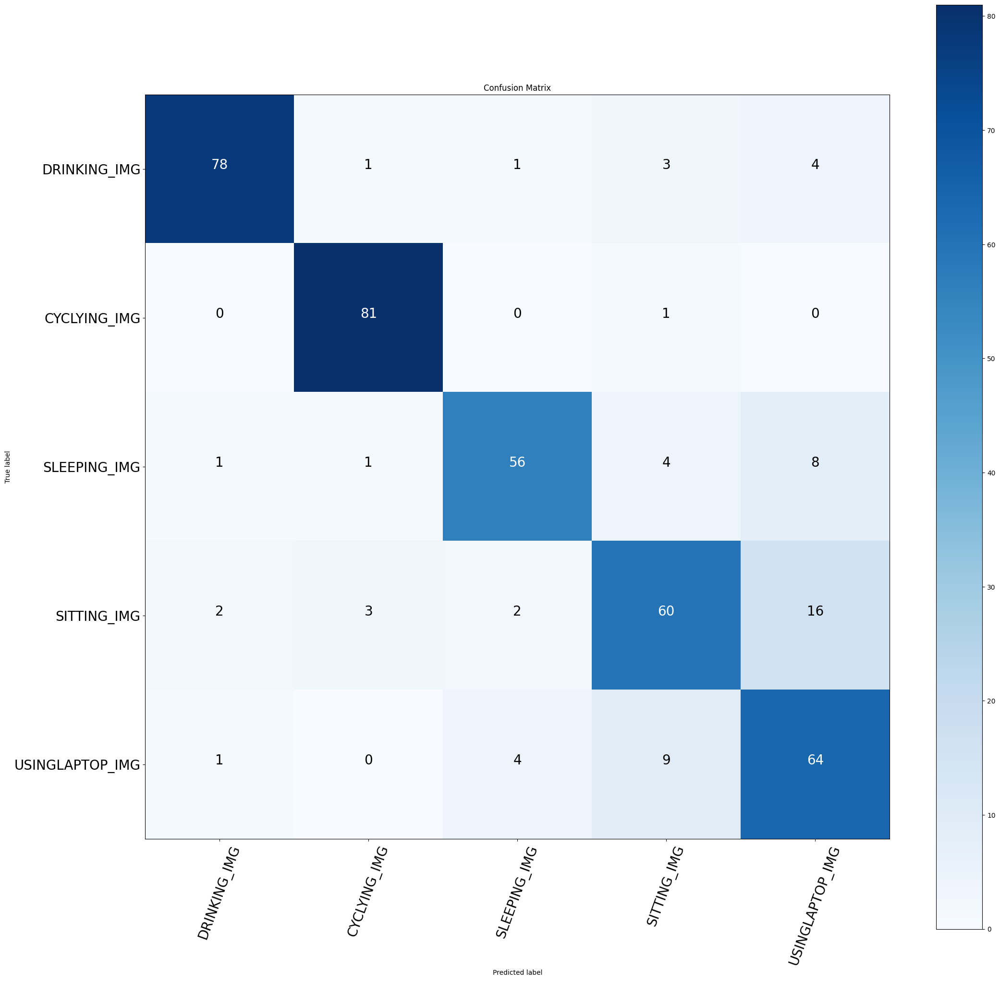

In [ ]:
# Confusion matrix for model
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes_1,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

### Second Model Confusion Matrix

In [ ]:
# make predictions using test_data using model_2
testing_data_predict_model_2 = model_2.predict(testing_data)
pred_classes_2 = testing_data_predict_model_2.argmax(axis=1)


13/13 [==============================] - 3s 158ms/step


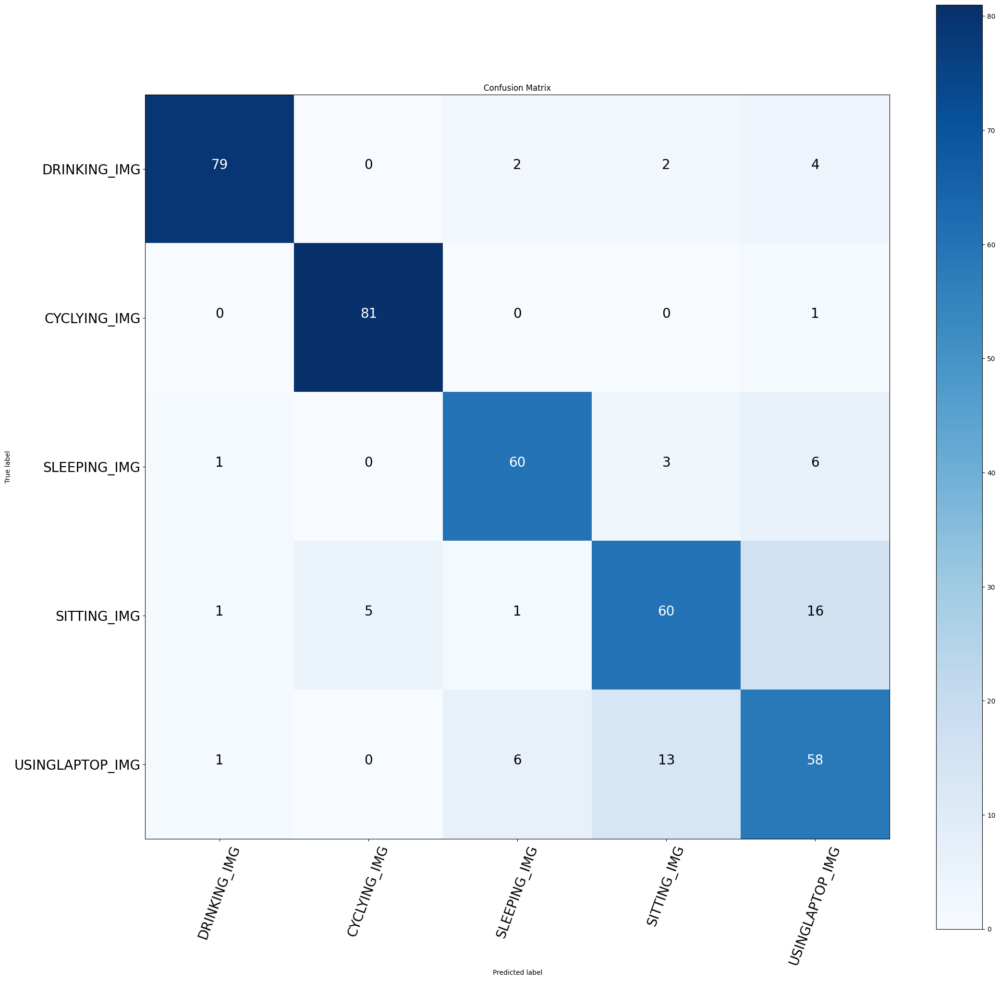

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes_2,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

### Third Model Confusion Matrix

In [ ]:
# make predictions using test_data using model_3
testing_data_predict_model_3 = model_3.predict(testing_data)
pred_classes_3 = testing_data_predict_model_3.argmax(axis=1)


13/13 [==============================] - 4s 355ms/step


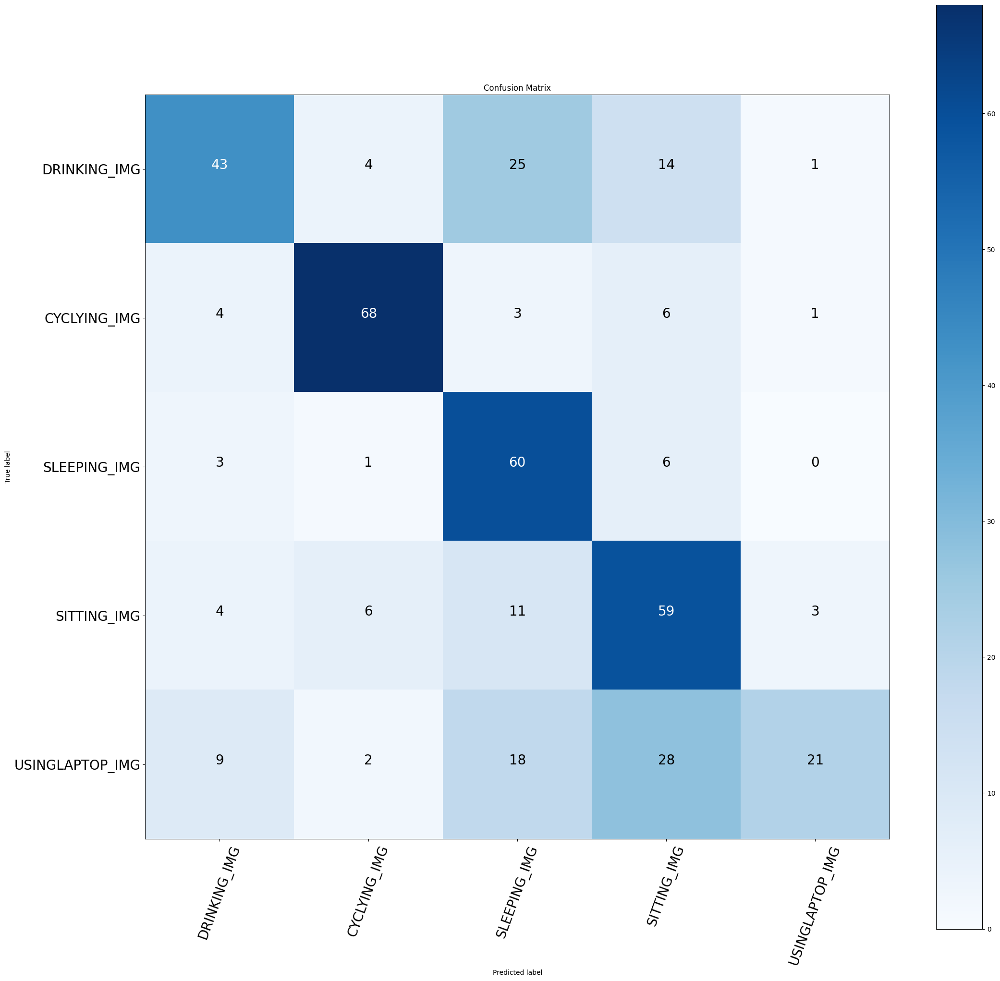

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes_3,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

In [ ]:
# make_confusion_matrix(validation_predict, y_val, classes=5)



# make_confusion_matrix(y_true=y_val,
#                       y_pred=validation_predict,
#                       classes=class_names,
#                       figsize=(100, 100),
#                       text_size=20,
#                       norm=False,
#                       savefig=False)

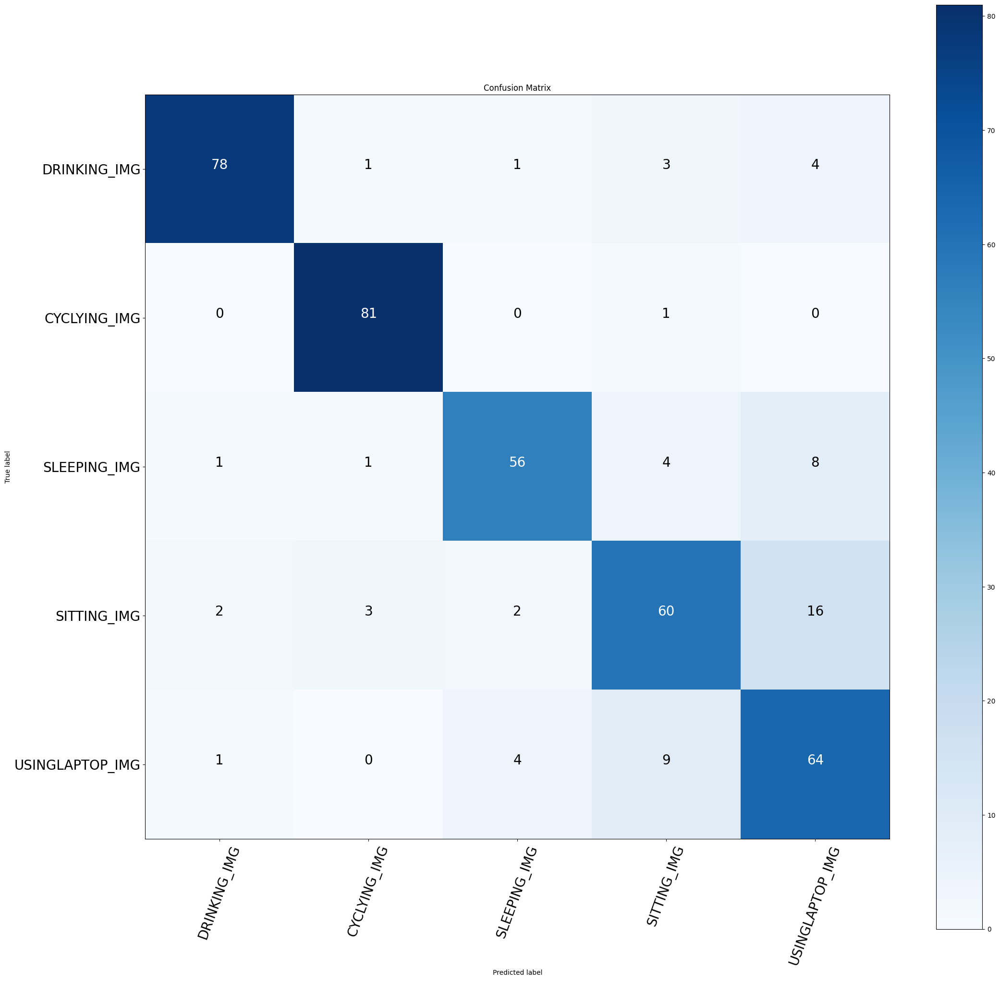

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.multioutput import MultiOutputClassifier

## Fine Tuning

In [ ]:
for layer_num, layer in enumerate(base_model.layers):
  # print(layer.name, layer.trainable)
  layer.name, layer.trainable
  

In [ ]:
# First check if all the layers of base model is not trainable 
for layer in base_model.layers:
  print(layer.name, layer.trainable)


input_4 False
conv2d_282 False
batch_normalization_282 False
activation_282 False
conv2d_283 False
batch_normalization_283 False
activation_283 False
conv2d_284 False
batch_normalization_284 False
activation_284 False
max_pooling2d_12 False
conv2d_285 False
batch_normalization_285 False
activation_285 False
conv2d_286 False
batch_normalization_286 False
activation_286 False
max_pooling2d_13 False
conv2d_290 False
batch_normalization_290 False
activation_290 False
conv2d_288 False
conv2d_291 False
batch_normalization_288 False
batch_normalization_291 False
activation_288 False
activation_291 False
average_pooling2d_27 False
conv2d_287 False
conv2d_289 False
conv2d_292 False
conv2d_293 False
batch_normalization_287 False
batch_normalization_289 False
batch_normalization_292 False
batch_normalization_293 False
activation_287 False
activation_289 False
activation_292 False
activation_293 False
mixed0 False
conv2d_297 False
batch_normalization_297 False
activation_297 False
conv2d_295 False

In [ ]:

# First We will set all the layers to be trainable 
# because we only want to set the upper trainable layers 
# A variable name "Upper_layers_set_to_trainable" is used
# to define the number of layers to be trained from base model

base_model.trainable = True

# Number of upper layers we want to train
Upper_layers_set_to_trainable = 5


# Freeze all layers except for the
for layer in base_model.layers[:-Upper_layers_set_to_trainable]:
  layer.trainable = False


In [ ]:
# Print all the layers set to trainable means layer.trainable = true
# number of frozen layers is the difference between the total layers and the
# number of upper layers set to trainable 
num_of_frozen_layers = len(base_model.layers) - Upper_layers_set_to_trainable

for layer in base_model.layers[num_of_frozen_layers:]:
  print(layer.name, layer.trainable)


activation_367 True
mixed9_1 True
concatenate_7 True
activation_375 True
mixed10 True


In [ ]:

# Create model 1 for fine tunning 
# Adding additional layer, 
# We can also add more layer's to it
model = tf.keras.Sequential()

model.add(tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer"))
model.add(base_model)
model.add(tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer"))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(5, activation='softmax', name='output_layer'))


In [ ]:
# compile model, define loss function, optimizer and metrics 
model.compile(loss='categorical_crossentropy',
                           optimizer=tf.keras.optimizers.Adam(),
                           metrics=['accuracy'])

# fit the model and start training process, validation data is for validation 
# to check if model is overfitting or not 
model.fit(training_data,epochs=3, validation_data=validation_data)

### Evaluate Fine Tuned Model

In [ ]:
# Evaluate on test data 
model_evalution_test_data = model.evaluate(testing_data)
model_evalution_test_data

# value at first index is for loss and for second it is accuracy

In [ ]:
# plot loss of the model 
plot_hist_loss(model.history)


In [ ]:
# plot accuracy of the model 
plot_hist(model.history)

In [ ]:
# TO PLOT Confusion matrix we can go back to "First Model Confusion Matrix"

In [ ]:
# For Confusion matrix 

### >>>>>>>>>>> MaKing Predictions with model >>>>> First Model Confusion matrix
## Only first model is fine tunned

## Ensemble Learning

In [ ]:
# Voting Classifier
def Ensemblelearning(Image_path, models):
  image = process_image(Image_path)
  image = tf.expand_dims(image, axis=0)

  model_predictions = []
  for i in range(len(models)):
    val = models[i].predict(image)
    val = np.argmax(val)
    model_predictions.append(val)

  return max(set(model_predictions), key = model_predictions.count)




### Evaluation Ensemble Results

In [ ]:
# Making predictions with Ensemble 
prediction_Ensemble = []

for img in X_test:
  prediction_Ensemble.append(Ensemblelearning(img, [model, model_2, model_3]))


1/1 [==============================] - 0s 21ms/step


In [ ]:
# create labels for confusion matrix
y_labels = []

for I in y_test:
  y_labels.append(np.argmax(I))


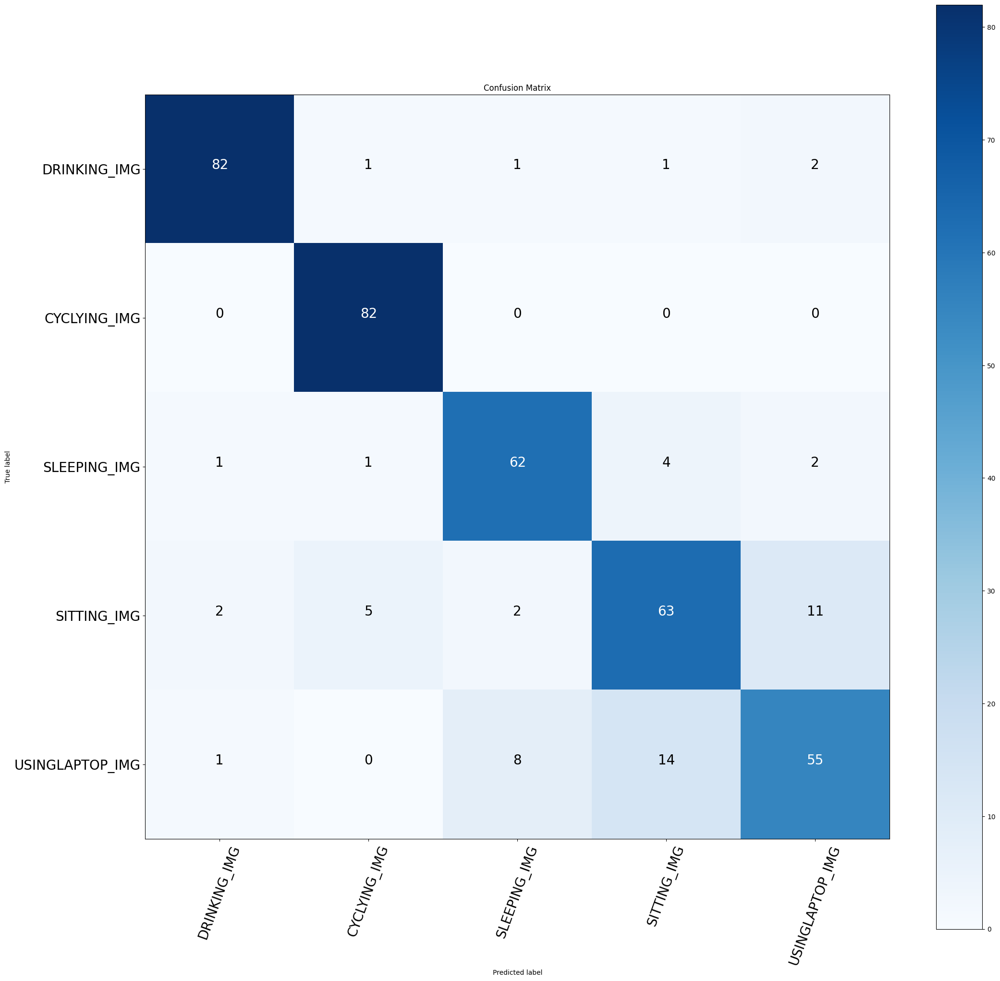

In [ ]:
# Ensemble Confusion Matrix 
make_confusion_matrix(y_true=y_labels,
                      y_pred=prediction_Ensemble,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

In [ ]:
#############################################################
#############################################################


In [ ]:
model1_predict_test = model.predict(testing_data)

13/13 [==============================] - 70s 5s/step


In [ ]:

y_labels = []
for images, labels in testing_data.unbatch(): # unbatch data and get images and labels
  y_labels.append(labels.numpy().argmax()) # (labels are one-hot)
y_labels[:10] 

[2, 2, 0, 4, 1, 3, 1, 3, 1, 4]

In [ ]:
pred_classes = model1_predict_test.argmax(axis=1)

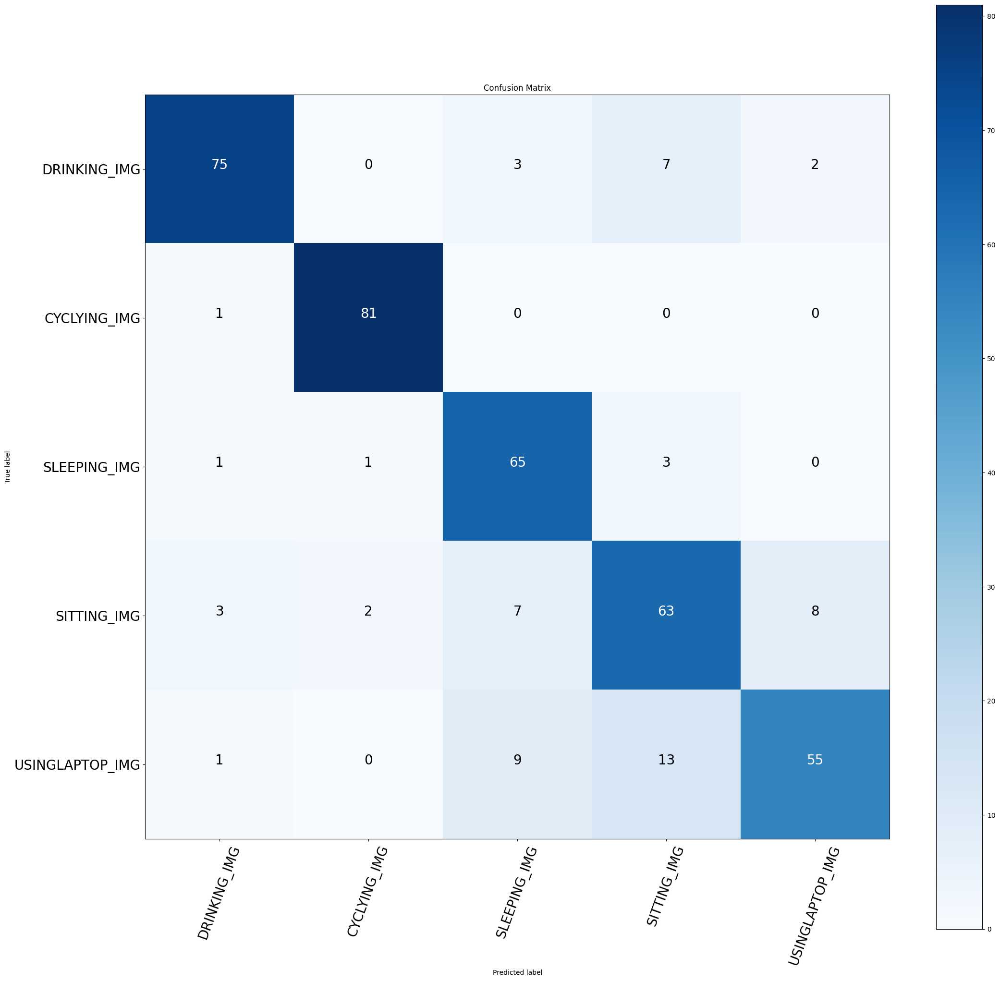

In [ ]:
# Ensemble Confusion Matrix 
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

In [ ]:

#############################################################
#############################################################

In [ ]:
model2_predict_test = model_2.predict(testing_data)

13/13 [==============================] - 85s 6s/step


In [ ]:
pred_classes = model2_predict_test.argmax(axis=1)

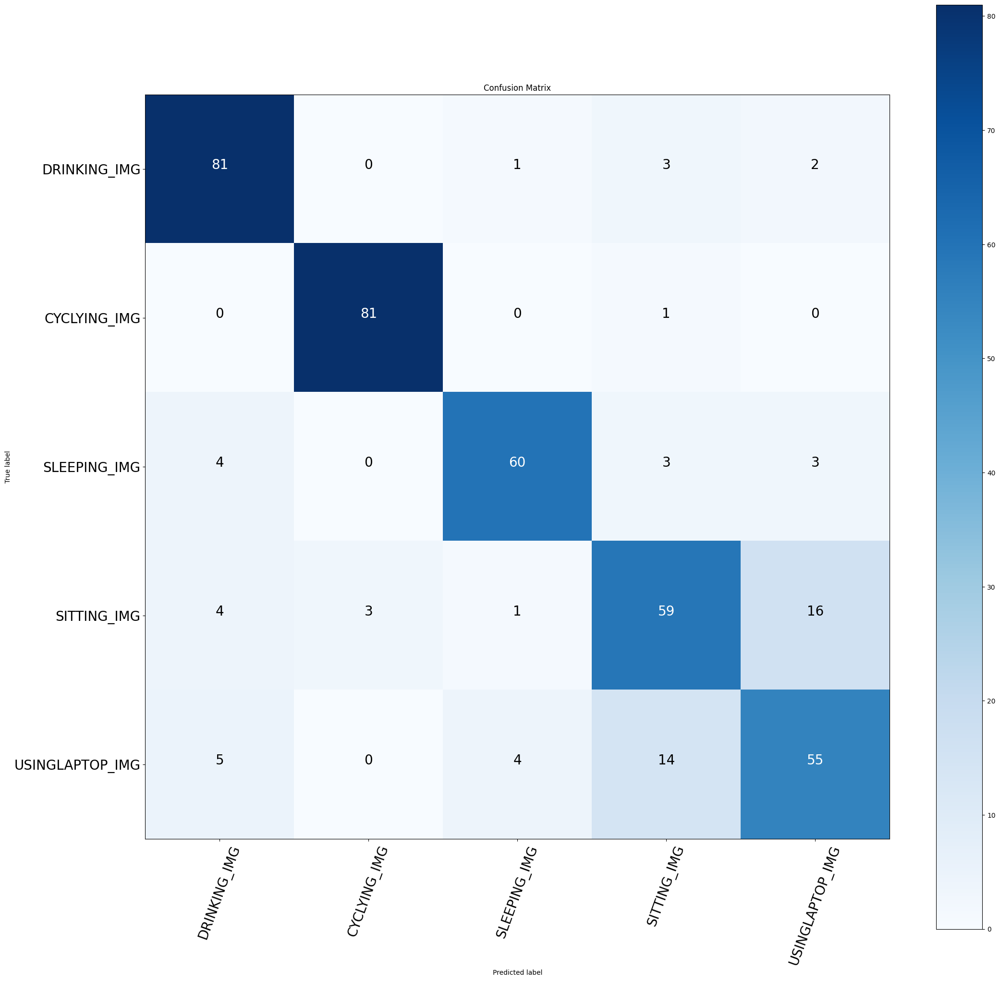

In [ ]:
# Ensemble Confusion Matrix 
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

In [ ]:

#############################################################
#############################################################

In [ ]:
model3_predict_test = model_3.predict(testing_data)

13/13 [==============================] - 309s 23s/step


In [ ]:
pred_classes = model3_predict_test.argmax(axis=1)

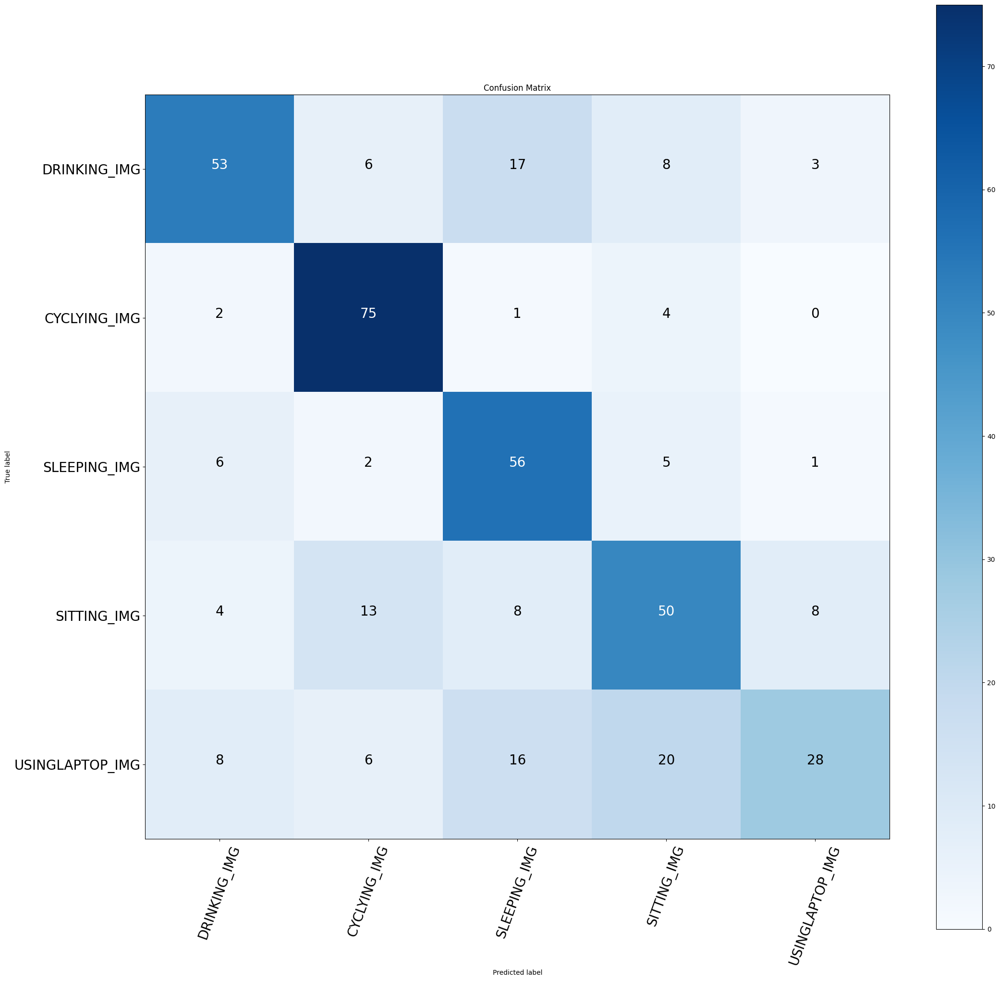

In [ ]:
# Ensemble Confusion Matrix 
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(25, 25),
                      text_size=20,
                      norm=False,
                      savefig=False)

## Example of CNN arch

In [ ]:
# Example of creating a sample Convolutional Neural Network 
# Not Used in this project but a good example of how to create
# a CNN model without compilation


# All Imports
from tensorflow import keras
from keras.layers.regularization.dropout import Dropout
from keras.layers.pooling.max_pooling2d import MaxPool2D
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Dense

# Create Sequential model 
model = keras.Sequential()

# Add convolutional Layers
model.add(Conv2D(32,(3,3),activation="relu",padding="same",name="conv_1",
                 input_shape=(150,150,3)))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(MaxPooling2D((2,2)))
model.add(Flatten())
model.add(Dropout(0.5))

model.add(Dense(512, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(1,activation="sigmoid"))


In [2]:
pip install keras_ocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 95.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 62.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 7.5 MB/s eta 0:00:00
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19579 sha256=c9edfed205791b275b70158eb678828f45784ca88ba167dab41db66793906cae
  Stored in directory: /root/.cache/pip/wheels/f2/ed/dd/d3a556ad245ef9dc570c6bcd2f22886d17b0b408dd3bbb9ac3
Successfully built validators


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5
1/1 [==============================] - 3s 3s/step


TypeError: ignored

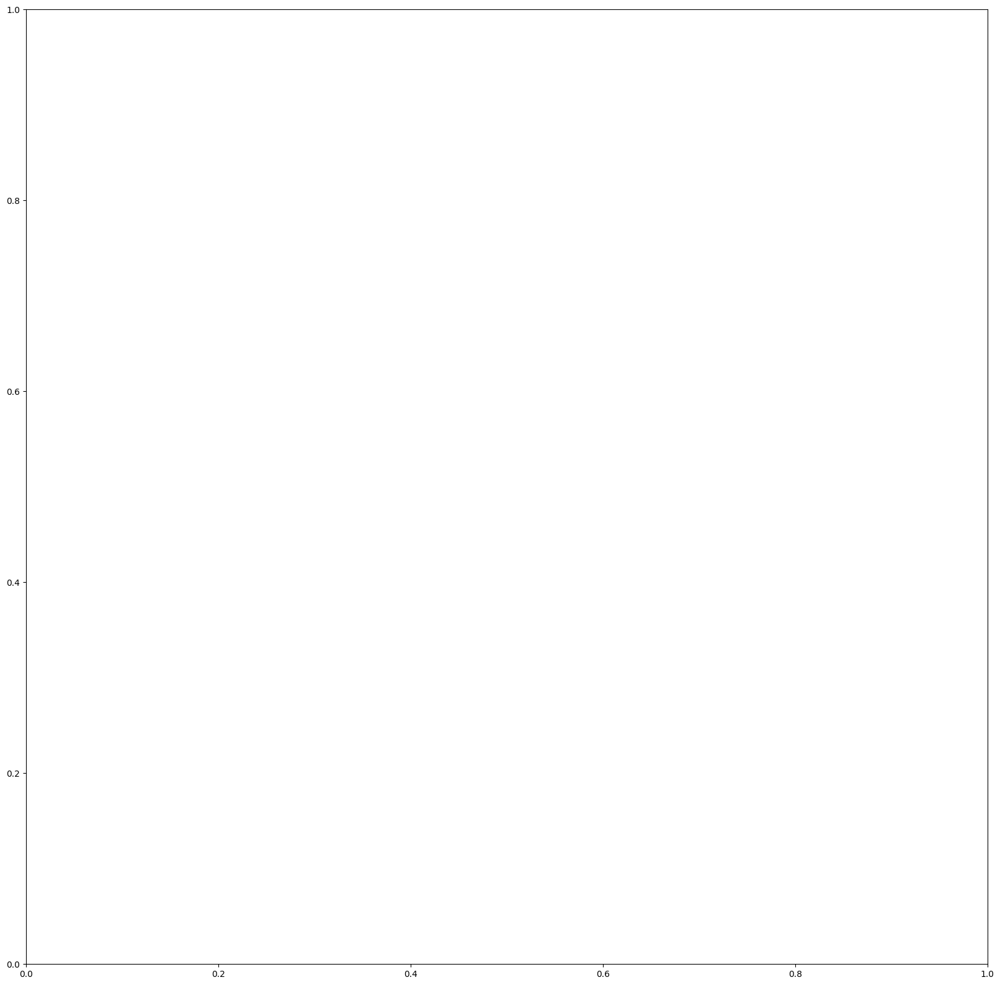

In [5]:
import matplotlib.pyplot as plt

import keras_ocr

# keras-ocr will automatically download pretrained
# weights for the detector and recognizer.
pipeline = keras_ocr.pipeline.Pipeline()

# Get a set of three example images
images = [
    keras_ocr.tools.read(url) for url in [
        'https://upload.wikimedia.org/wikipedia/commons/b/b4/EUBanana-500x112.jpg'
    ]
]

# Each list of predictions in prediction_groups is a list of
# (word, box) tuples.
prediction_groups = pipeline.recognize(images)

# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))
for ax, image, predictions in zip(axs, images, prediction_groups):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)
